# Violence detection

#### LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import os.path
from pathlib import Path
import glob
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import optimizers
optimizers.RMSprop
optimizers.Adam
from tensorflow.keras.optimizers import RMSprop,Adam

#### MODEL LAYERS

In [10]:
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D
from keras import models
from keras import layers
import tensorflow as tf
from keras import backend as K

In [12]:
from keras_applications import vgg16

#### IGNORING WARNINGS

In [13]:
from warnings import filterwarnings

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

### PATH & LABELS

#### TRAIN-TEST-VALIDATION PATH

In [14]:
Train_Data_Path = Path("C:/Users\HP/Desktop/vo/violence_Train")
Test_Data_Path = Path("C:/Users/HP/Desktop/vo/violence_Test")
Validation_Data_Path = Path("C:/Users/HP/Desktop/vo/violence_Val")

#### JPG PATH

In [15]:
Train_JPG_Path = list(Train_Data_Path.glob(r"*/*.jpg"))

In [16]:
Test_JPG_Path = list(Test_Data_Path.glob(r"*/*.jpg"))

In [17]:
Validation_JPG_Path = list(Validation_Data_Path.glob(r"*/*.jpg"))

#### JPG LABELS

In [18]:
Train_JPG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Train_JPG_Path))

In [19]:
print("Violence COUNT: ", Train_JPG_Labels.count("violence"))
print("NonViolence COUNT: ", Train_JPG_Labels.count("non_violence"))

Violence COUNT:  3000
NonViolence COUNT:  3000


In [20]:
Test_JPG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Test_JPG_Path))

In [21]:
print("violence COUNT: ", Test_JPG_Labels.count("violence"))
print("NON violence COUNT: ", Test_JPG_Labels.count("non_violence"))

violence COUNT:  1000
NON violence COUNT:  1000


In [22]:
Validation_JPG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Validation_JPG_Path))

In [23]:
print("violenc COUNT: ", Validation_JPG_Labels.count("violence"))
print("NON violenc COUNT: ", Validation_JPG_Labels.count("non_violence"))

violenc COUNT:  1000
NON violenc COUNT:  1000


# TRANSFORMATION TO SERIES STRUCTURE

#### TRAIN

In [24]:
Train_JPG_Path_Series = pd.Series(Train_JPG_Path,name="JPG").astype(str)
Train_JPG_Labels_Series = pd.Series(Train_JPG_Labels,name="CATEGORY")

#### TEST

In [25]:
Test_JPG_Path_Series = pd.Series(Test_JPG_Path,name="JPG").astype(str)
Test_JPG_Labels_Series = pd.Series(Test_JPG_Labels,name="CATEGORY")

#### VALIDATION

In [26]:
Validation_JPG_Path_Series = pd.Series(Validation_JPG_Path,name="JPG").astype(str)
Validation_JPG_Labels_Series = pd.Series(Validation_JPG_Labels,name="CATEGORY")

# TRANSFORMATION TO DATAFRAME STRUCTURE

#### TRAIN

In [27]:
Main_Train_Data = pd.concat([Train_JPG_Path_Series,Train_JPG_Labels_Series],axis=1)

In [28]:
print(Main_Train_Data.head(-1))

                                                    JPG      CATEGORY
0     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
1     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
2     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
3     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
4     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
...                                                 ...           ...
5994  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5995  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5996  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5997  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5998  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence

[5999 rows x 2 columns]


In [29]:
Main_Train_Data["CATEGORY"].replace({"non_violence":"non_violence"},inplace=True)

In [30]:
print(Main_Train_Data.head(-1))

                                                    JPG      CATEGORY
0     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
1     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
2     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
3     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
4     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
...                                                 ...           ...
5994  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5995  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5996  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5997  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5998  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence

[5999 rows x 2 columns]


#### TEST

In [31]:
Main_Test_Data = pd.concat([Test_JPG_Path_Series,Test_JPG_Labels_Series],axis=1)

In [32]:
print(Main_Test_Data.head(-1))

                                                    JPG      CATEGORY
0     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
1     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
2     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
3     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
4     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
...                                                 ...           ...
1994  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1995  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1996  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1997  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1998  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence

[1999 rows x 2 columns]


In [33]:
Main_Test_Data["CATEGORY"].replace({"non_violencee":"non_violence"},inplace=True)

In [34]:
print(Main_Test_Data.head(-1))

                                                    JPG      CATEGORY
0     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
1     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
2     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
3     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
4     C:\Users\HP\Desktop\vo\violence_Test\non_viole...  non_violence
...                                                 ...           ...
1994  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1995  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1996  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1997  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence
1998  C:\Users\HP\Desktop\vo\violence_Test\violence\...      violence

[1999 rows x 2 columns]


#### VALIDATION

In [35]:
Main_Validation_Data = pd.concat([Validation_JPG_Path_Series,Validation_JPG_Labels_Series],axis=1)

In [36]:
print(Main_Validation_Data.head(-1))

                                                    JPG      CATEGORY
0     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
1     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
2     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
3     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
4     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
...                                                 ...           ...
1994  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1995  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1996  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1997  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1998  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence

[1999 rows x 2 columns]


In [37]:
Main_Validation_Data["CATEGORY"].replace({"non_violence":"non_violence"},inplace=True)

In [38]:
print(Main_Validation_Data.head(-1))

                                                    JPG      CATEGORY
0     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
1     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
2     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
3     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
4     C:\Users\HP\Desktop\vo\violence_Val\non_violen...  non_violence
...                                                 ...           ...
1994  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1995  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1996  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1997  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence
1998  C:\Users\HP\Desktop\vo\violence_Val\violence\V...      violence

[1999 rows x 2 columns]


# SHUFFLING

In [39]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)
Main_Test_Data = Main_Test_Data.sample(frac=1).reset_index(drop=True)
Main_Validation_Data = Main_Validation_Data.sample(frac=1).reset_index(drop=True)

In [40]:
print(Main_Train_Data.head(-1))
print("---"*20)
print(Main_Test_Data.head(-1))
print("---"*20)
print(Main_Validation_Data.head(-1))

                                                    JPG      CATEGORY
0     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
1     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
2     C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
3     C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
4     C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
...                                                 ...           ...
5994  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence
5995  C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
5996  C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
5997  C:\Users\HP\Desktop\vo\violence_Train\non_viol...  non_violence
5998  C:\Users\HP\Desktop\vo\violence_Train\violence...      violence

[5999 rows x 2 columns]
------------------------------------------------------------
                                                    JPG      CATEGORY
0   

# VISUALIZATION

In [41]:
plt.style.use("default")

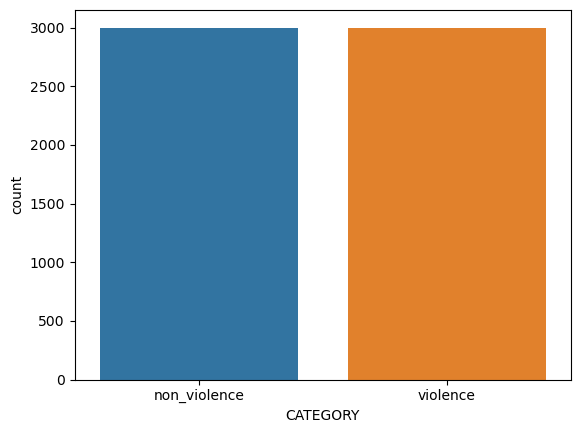

In [42]:
sns.countplot(Main_Train_Data["CATEGORY"])
plt.show()

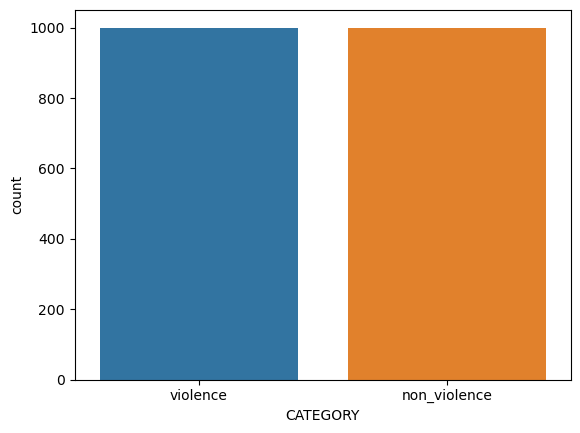

In [43]:
sns.countplot(Main_Test_Data["CATEGORY"])
plt.show()

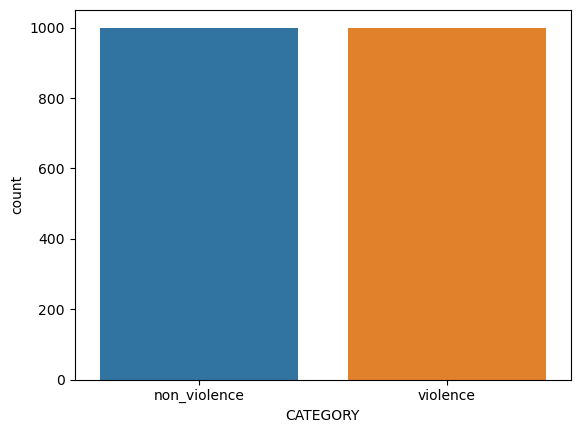

In [44]:
sns.countplot(Main_Validation_Data["CATEGORY"])
plt.show()

Text(0.5, 1.0, 'non_violence')

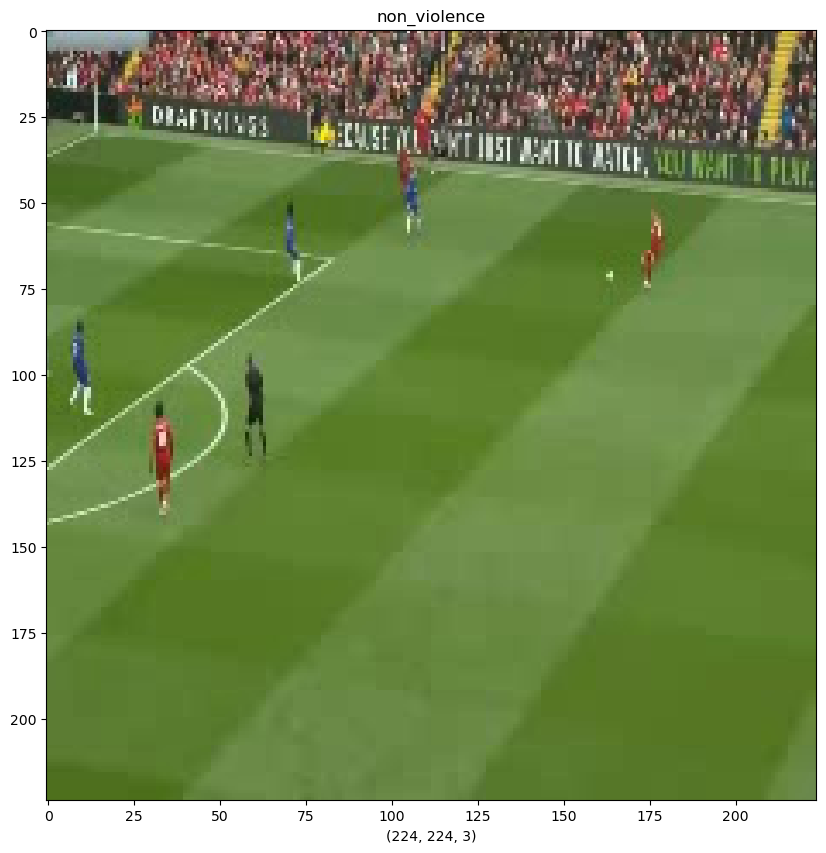

In [48]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Train_Data["JPG"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][0])

Text(0.5, 1.0, 'non_violence')

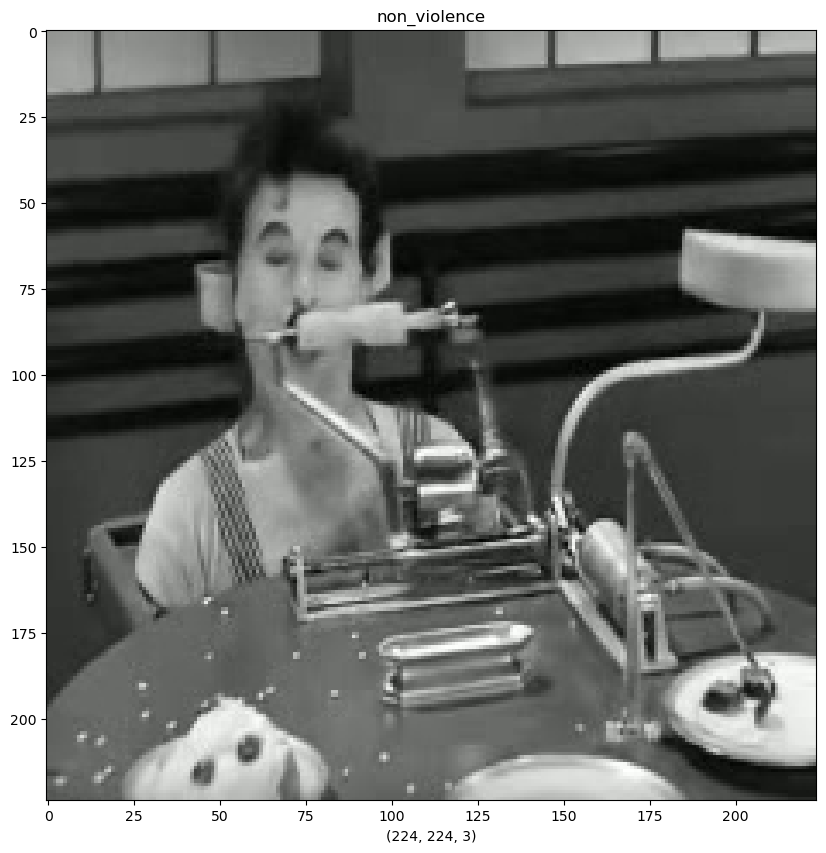

In [49]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Train_Data["JPG"][1888])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][1888])

Text(0.5, 1.0, 'violence')

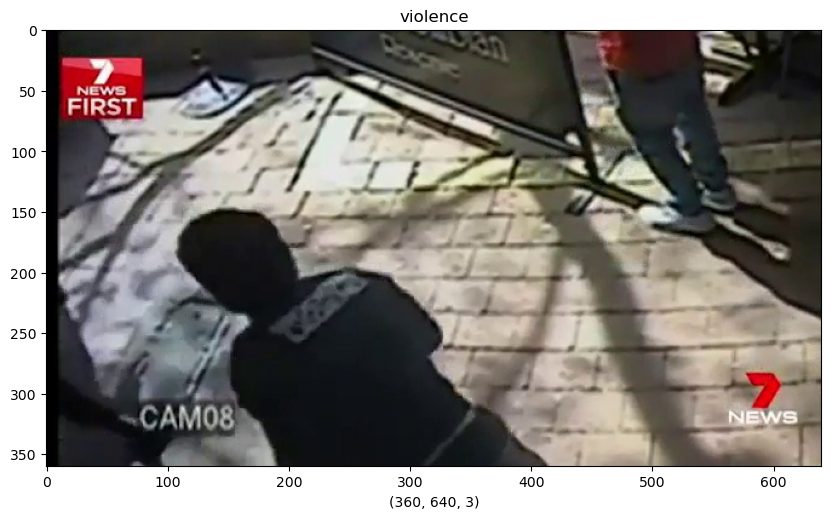

In [50]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Test_Data["JPG"][1005])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Test_Data["CATEGORY"][1005])

Text(0.5, 1.0, 'violence')

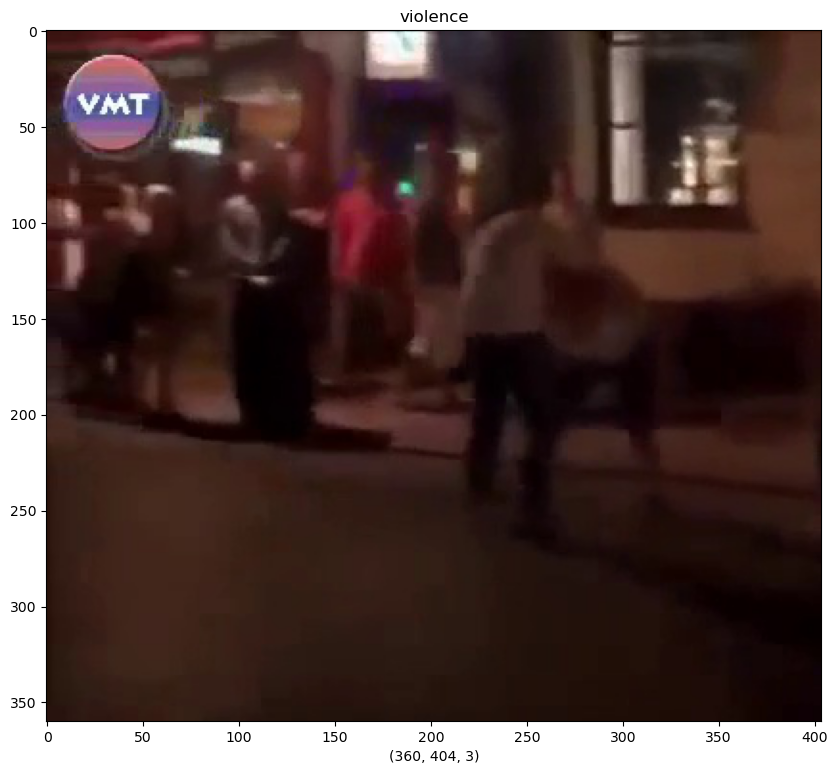

In [51]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Validation_Data["JPG"][26])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Validation_Data["CATEGORY"][26])

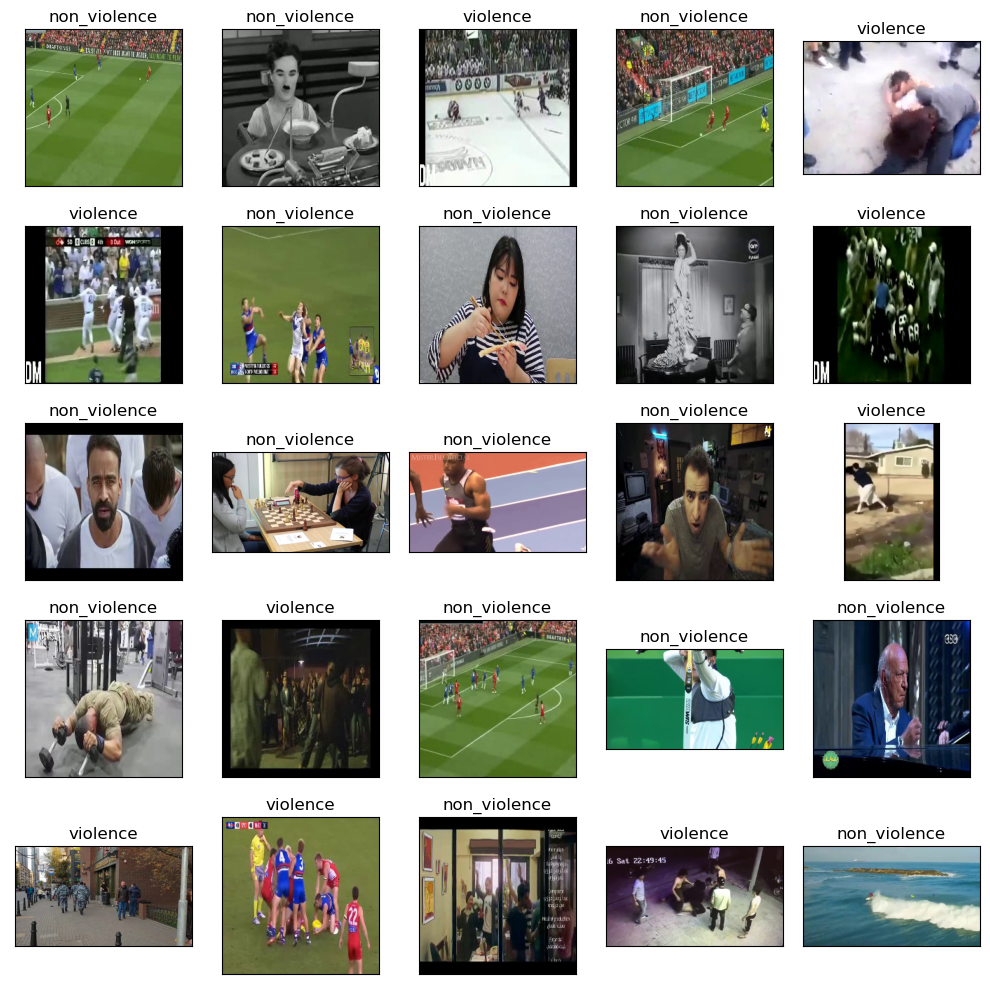

In [52]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Train_Data["JPG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

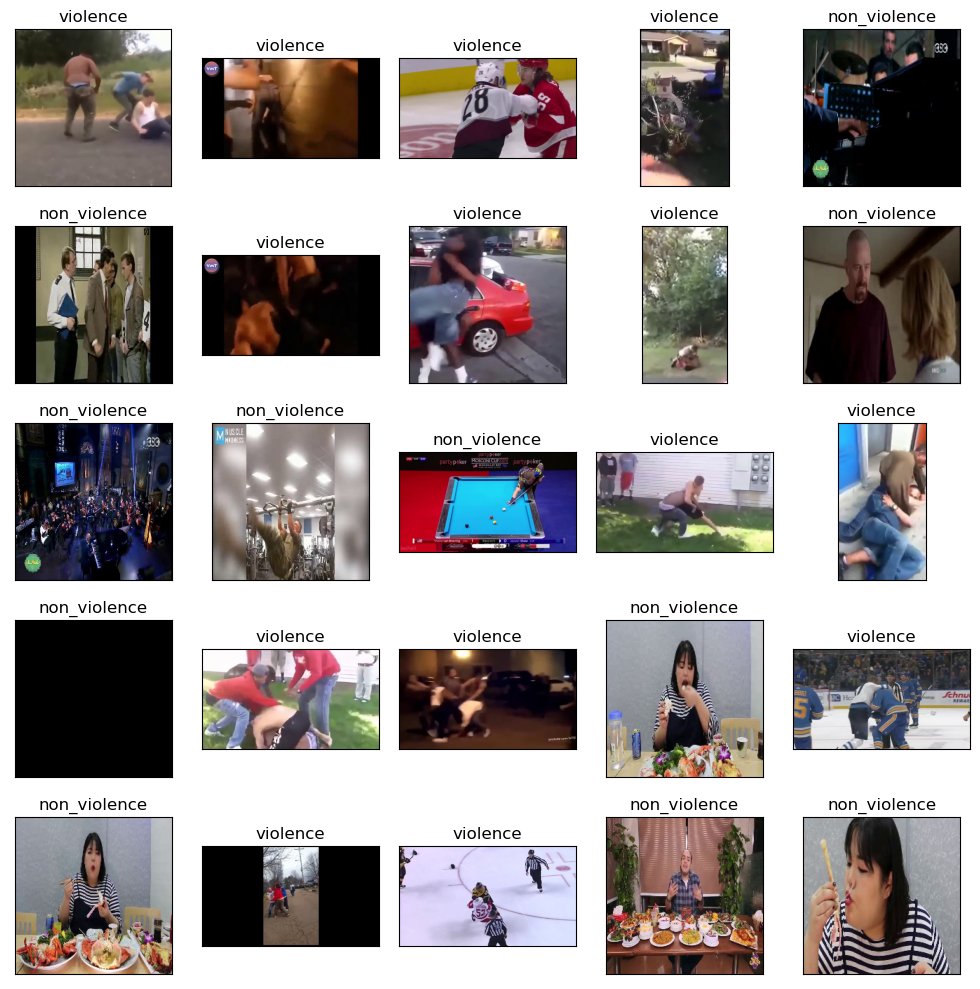

In [53]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Test_Data["JPG"][i]))
    ax.set_title(Main_Test_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

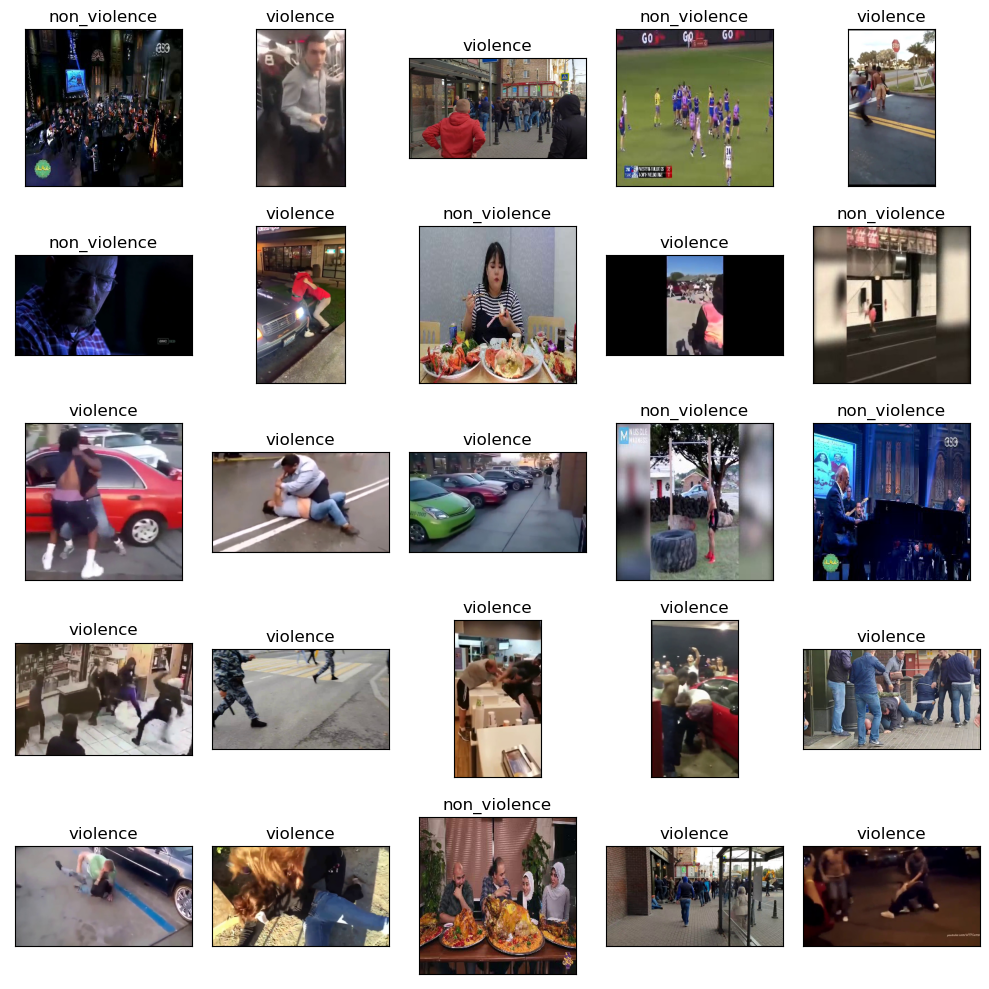

In [54]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Validation_Data["JPG"][i]))
    ax.set_title(Main_Validation_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

# DETERMINATION TRAIN AND TEST DATA

#### IMAGE GENERATOR

In [55]:
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    zoom_range=0.7,
                                    shear_range=0.7,
                                    rotation_range=50,
                                    horizontal_flip=True,
                                     brightness_range=[0.2,0.9],
                                     vertical_flip=True)

In [56]:
Test_Val_Generator = ImageDataGenerator(rescale=1./255,validation_split=0.5)

#### HOW GENERATOR APPLIED IMAGE LOOK LIKE

In [57]:
example_Image = Main_Train_Data["JPG"][30]
Load_Image = image.load_img(example_Image,target_size=(210,210))
Array_Image = image.img_to_array(Load_Image)
Array_Image = Array_Image.reshape((1,) + Array_Image.shape)

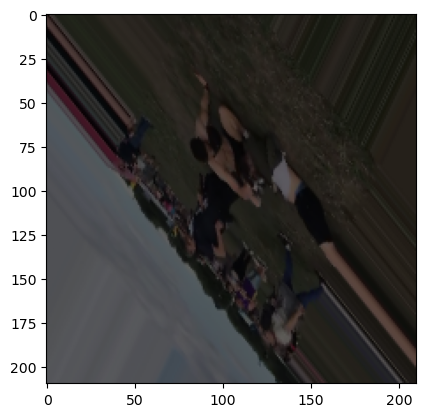

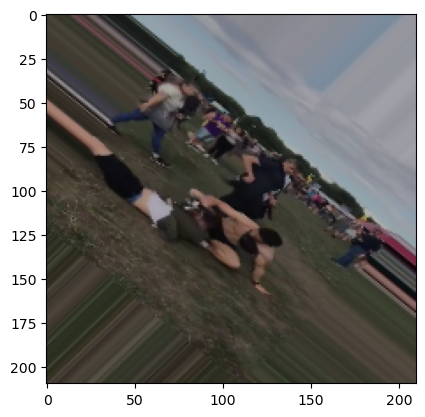

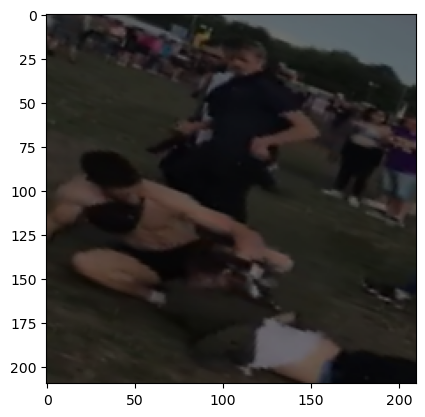

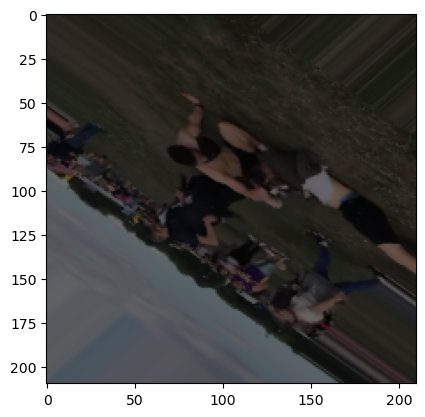

In [58]:
i = 0
for batch in Train_Generator.flow(Array_Image,batch_size=5):
    plt.figure(i)
    Image = plt.imshow(image.img_to_array(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()

# APPLYING GENERATOR AND TRANSFORMATION TO TENSOR

In [59]:
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Main_Train_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="grayscale",
                                                   class_mode="categorical",
                                                   subset="training",
                                                   seed=42,
                                                   batch_size=16)

Found 6000 validated image filenames belonging to 2 classes.


In [60]:
Test_IMG_Set = Test_Val_Generator.flow_from_dataframe(dataframe=Main_Test_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="grayscale",
                                                   class_mode="categorical",
                                                   seed=42,
                                                   batch_size=16)

Found 2000 validated image filenames belonging to 2 classes.


In [61]:
Validation_IMG_Set = Test_Val_Generator.flow_from_dataframe(dataframe=Main_Validation_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="grayscale",
                                                   class_mode="categorical",
                                                      subset="validation",
                                                   seed=42,
                                                   batch_size=16)

Found 1000 validated image filenames belonging to 2 classes.


#### IMAGE SET CHECKING

In [62]:
for data_batch,label_batch in Train_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (16, 256, 256, 1)
LABEL SHAPE:  (16, 2)


In [63]:
for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (16, 256, 256, 1)
LABEL SHAPE:  (16, 2)


In [64]:
for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (16, 256, 256, 1)
LABEL SHAPE:  (16, 2)


In [65]:
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'non_violence': 0, 'violence': 1}
[0, 0, 1, 0, 1]
(256, 256, 1)
------------------------------------------------------------
VALIDATION: 
{'non_violence': 0, 'violence': 1}
[0, 1, 1, 0, 1]
(256, 256, 1)
------------------------------------------------------------
TEST: 
{'non_violence': 0, 'violence': 1}
[1, 1, 1, 1, 0]
(256, 256, 1)


#### CALLBACK

In [66]:
Call_Back_Early = tf.keras.callbacks.EarlyStopping(monitor="loss",
                                                   patience=5,
                                                   mode="min",verbose=1, restore_best_weights=True)

In [67]:
Call_Back_Check = tf.keras.callbacks.ModelCheckpoint(monitor="val_accuracy",
                                                     save_best_only=True,
                                                     filepath="./my_model")

## Models 

### CNN WITH Conv2D

In [68]:
%mkdir my_model

A subdirectory or file my_model already exists.


In [69]:
Model_One = Sequential()

#
Model_One.add(Conv2D(32,(3,3),activation="relu",
                 input_shape=(256,256,1)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))
#
Model_One.add(Conv2D(64,(3,3),activation="relu",
                 strides=(2,2)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))
#
Model_One.add(Conv2D(128,(3,3),activation="relu",
                 strides=(2,2)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))
#
Model_One.add(Conv2D(128,(3,3),activation="relu",
                 strides=(2,2)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))

#
Model_One.add(Flatten())
Model_One.add(Dropout(0.5))
Model_One.add(Dense(512,activation="relu"))
Model_One.add(Dense(2,activation="softmax"))

In [70]:
Model_One.compile(optimizer=RMSprop(lr=0.001),loss="categorical_crossentropy",metrics=["accuracy"])

In [71]:
CNN_Model_One = Model_One.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=[Call_Back_Check,Call_Back_Early],
                      epochs=50)

Epoch 1/50
375/375 [==============================] - 300s 798ms/step - loss: 0.6887 - accuracy: 0.5458 - val_loss: 0.6872 - val_accuracy: 0.4920
Epoch 2/50
375/375 [==============================] - 305s 813ms/step - loss: 0.6770 - accuracy: 0.5762 - val_loss: 0.6896 - val_accuracy: 0.5570
Epoch 3/50
375/375 [==============================] - 320s 854ms/step - loss: 0.6713 - accuracy: 0.5780 - val_loss: 0.7240 - val_accuracy: 0.5120
Epoch 4/50
375/375 [==============================] - 283s 755ms/step - loss: 0.6620 - accuracy: 0.6017 - val_loss: 1.0366 - val_accuracy: 0.5080
Epoch 5/50
375/375 [==============================] - 282s 751ms/step - loss: 0.6653 - accuracy: 0.6030 - val_loss: 0.7794 - val_accuracy: 0.5890
Epoch 6/50
375/375 [==============================] - 278s 742ms/step - loss: 0.6627 - accuracy: 0.6043 - val_loss: 0.7318 - val_accuracy: 0.5320
Epoch 7/50
375/375 [==============================] - 273s 727ms/step - loss: 0.6583 - accuracy: 0.6190 - val_loss: 0.7779 -

In [72]:
Model_Results = Model_One.evaluate(Test_IMG_Set,verbose=False)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

LOSS:  1.2002
ACCURACY:  0.56


No handles with labels found to put in legend.


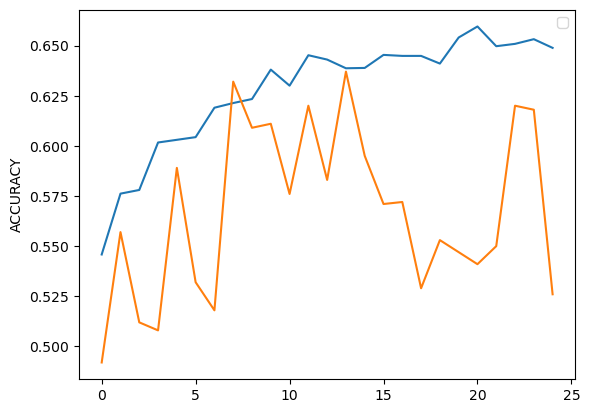

In [73]:
plt.plot(CNN_Model_One.history["accuracy"])
plt.plot(CNN_Model_One.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

<AxesSubplot:>

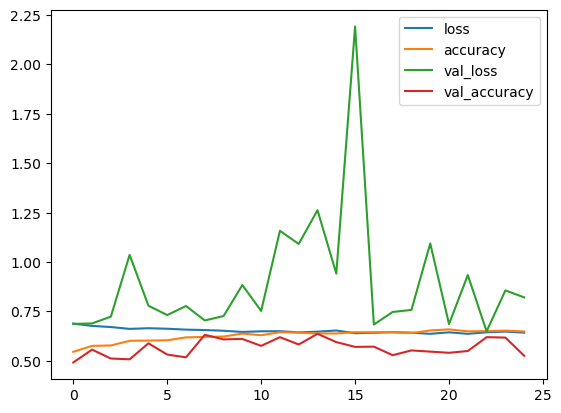

In [74]:
Dict_Summary_One = pd.DataFrame(CNN_Model_One.history)
Dict_Summary_One.plot()

In [75]:
Prediction_One = Model_One.predict(Test_IMG_Set)
Prediction_One = Prediction_One.argmax(axis=-1)

In [76]:
print(Prediction_One)

[0 0 0 ... 0 0 0]


# CNN - RNN

In [77]:
Model_Two = Sequential()

Model_Two.add(Conv2D(12,(3,3),activation="relu",
                 input_shape=(256,256,1)))
Model_Two.add(BatchNormalization())
Model_Two.add(MaxPooling2D((2,2)))

#
Model_Two.add(Conv2D(24,(3,3),
                 activation="relu",padding="same"))
Model_Two.add(Dropout(0.2))
Model_Two.add(MaxPooling2D((2,2)))


#
Model_Two.add(TimeDistributed(Flatten()))
Model_Two.add(Bidirectional(LSTM(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))
Model_Two.add(Bidirectional(GRU(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))

#
Model_Two.add(Flatten())
Model_Two.add(Dense(512,activation="relu"))
Model_Two.add(Dropout(0.5))
Model_Two.add(Dense(256,activation="relu"))
Model_Two.add(Dropout(0.5))
Model_Two.add(Dense(2,activation="softmax"))

In [78]:
Model_Two.compile(optimizer=RMSprop(lr=0.001),loss="categorical_crossentropy",metrics=["accuracy"])

In [79]:
CNN_Model_Two = Model_Two.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=[Call_Back_Check,Call_Back_Early],
                      epochs=50)

Epoch 1/50
375/375 [==============================] - 469s 1s/step - loss: 0.7449 - accuracy: 0.5388 - val_loss: 0.6785 - val_accuracy: 0.6080
Epoch 2/50
375/375 [==============================] - 489s 1s/step - loss: 0.6868 - accuracy: 0.5977 - val_loss: 0.6487 - val_accuracy: 0.5590
Epoch 3/50
375/375 [==============================] - ETA: 0s - loss: 0.6685 - accuracy: 0.6188INFO:tensorflow:Assets written to: .\my_model\assets


375/375 [==============================] - 987s 3s/step - loss: 0.6685 - accuracy: 0.6188 - val_loss: 0.5840 - val_accuracy: 0.6680
Epoch 4/50
375/375 [==============================] - 561s 1s/step - loss: 0.6596 - accuracy: 0.6372 - val_loss: 0.6405 - val_accuracy: 0.5920
Epoch 5/50
375/375 [==============================] - 582s 2s/step - loss: 0.6532 - accuracy: 0.6423 - val_loss: 0.7979 - val_accuracy: 0.5070
Epoch 6/50
375/375 [==============================] - ETA: 0s - loss: 0.6494 - accuracy: 0.6472INFO:tensorflow:Assets written to: .\my_model\assets


INFO:tensorflow:Assets written to: .\my_model\assets


375/375 [==============================] - 596s 2s/step - loss: 0.6494 - accuracy: 0.6472 - val_loss: 0.5624 - val_accuracy: 0.7330
Epoch 7/50
375/375 [==============================] - 651s 2s/step - loss: 0.6414 - accuracy: 0.6432 - val_loss: 0.7452 - val_accuracy: 0.5480
Epoch 8/50
375/375 [==============================] - 666s 2s/step - loss: 0.6449 - accuracy: 0.6502 - val_loss: 0.6258 - val_accuracy: 0.6490
Epoch 9/50
375/375 [==============================] - 672s 2s/step - loss: 0.6323 - accuracy: 0.6677 - val_loss: 0.5815 - val_accuracy: 0.6900
Epoch 10/50
375/375 [==============================] - 668s 2s/step - loss: 0.6419 - accuracy: 0.6572 - val_loss: 0.5442 - val_accuracy: 0.7210
Epoch 11/50
375/375 [==============================] - ETA: 0s - loss: 0.6276 - accuracy: 0.6660INFO:tensorflow:Assets written to: .\my_model\assets


INFO:tensorflow:Assets written to: .\my_model\assets


375/375 [==============================] - 697s 2s/step - loss: 0.6276 - accuracy: 0.6660 - val_loss: 0.5269 - val_accuracy: 0.7520
Epoch 12/50
375/375 [==============================] - 708s 2s/step - loss: 0.6280 - accuracy: 0.6648 - val_loss: 0.6148 - val_accuracy: 0.7180
Epoch 13/50
375/375 [==============================] - 868s 2s/step - loss: 0.6461 - accuracy: 0.6428 - val_loss: 0.6210 - val_accuracy: 0.6400
Epoch 14/50
375/375 [==============================] - 23035s 62s/step - loss: 0.6416 - accuracy: 0.6578 - val_loss: 0.6309 - val_accuracy: 0.6040
Epoch 15/50
375/375 [==============================] - 701s 2s/step - loss: 0.6474 - accuracy: 0.6515 - val_loss: 0.7483 - val_accuracy: 0.6480
Epoch 16/50
375/375 [==============================] - 741s 2s/step - loss: 0.6450 - accuracy: 0.6492 - val_loss: 0.5952 - val_accuracy: 0.6340
Epoch 00016: early stopping


In [80]:
Model_Results_Two = Model_Two.evaluate(Test_IMG_Set,verbose=False)
print("LOSS:  " + "%.4f" % Model_Results_Two[0])
print("ACCURACY:  " + "%.2f" % Model_Results_Two[1])

LOSS:  0.5186
ACCURACY:  0.77


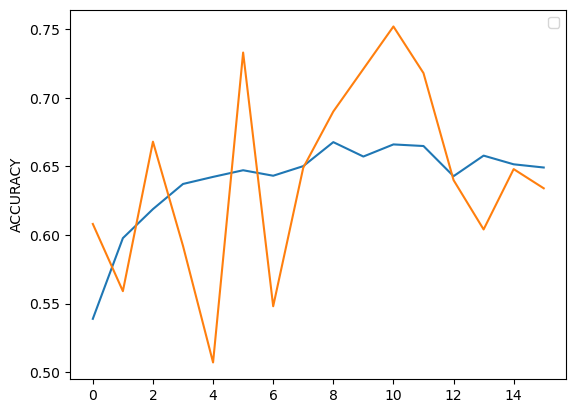

In [81]:
plt.plot(CNN_Model_Two.history["accuracy"])
plt.plot(CNN_Model_Two.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

<AxesSubplot:>

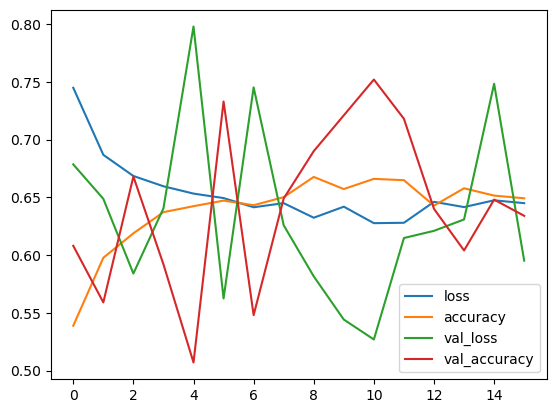

In [82]:
Dict_Summary_Two = pd.DataFrame(CNN_Model_Two.history)
Dict_Summary_Two.plot()

In [83]:
Prediction_Two = Model_Two.predict(Test_IMG_Set)
Prediction_Two = Prediction_Two.argmax(axis=-1)

In [84]:
print(Prediction_Two)

[1 0 0 ... 0 0 1]


# FULLY-CONNECTED

In [85]:
Model_Three = tf.keras.models.Sequential([
  # inputs 
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Flatten(input_shape=(256,)),
  # hiddens layers
    
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  # output layer
  tf.keras.layers.Dense(2,activation="softmax")
])

In [86]:
Model_Three.compile(optimizer=RMSprop(lr=0.001),loss="categorical_crossentropy",metrics=["accuracy"])

In [87]:
CNN_Model_Three = Model_Three.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=[Call_Back_Check,Call_Back_Early],
                      epochs=50)

Epoch 1/50
375/375 [==============================] - 184s 457ms/step - loss: 0.6909 - accuracy: 0.5265 - val_loss: 0.6854 - val_accuracy: 0.5390
Epoch 2/50
375/375 [==============================] - 127s 339ms/step - loss: 0.6763 - accuracy: 0.5697 - val_loss: 0.6447 - val_accuracy: 0.5880
Epoch 3/50
375/375 [==============================] - 137s 366ms/step - loss: 0.6704 - accuracy: 0.5855 - val_loss: 0.6380 - val_accuracy: 0.6210
Epoch 4/50
375/375 [==============================] - 143s 380ms/step - loss: 0.6615 - accuracy: 0.5948 - val_loss: 0.6570 - val_accuracy: 0.6030
Epoch 5/50
375/375 [==============================] - 126s 337ms/step - loss: 0.6592 - accuracy: 0.6030 - val_loss: 0.6533 - val_accuracy: 0.5850
Epoch 6/50
375/375 [==============================] - 127s 338ms/step - loss: 0.6579 - accuracy: 0.6118 - val_loss: 0.6516 - val_accuracy: 0.6190
Epoch 7/50
375/375 [==============================] - 118s 314ms/step - loss: 0.6555 - accuracy: 0.6112 - val_loss: 0.6649 -

In [88]:
Model_Prediction_Three = Model_Three.evaluate(Test_IMG_Set,verbose=False)
print("LOSS:  " + "%.4f" % Model_Prediction_Three[0])
print("ACCURACY:  " + "%.2f" % Model_Prediction_Three[1])

LOSS:  0.6839
ACCURACY:  0.60


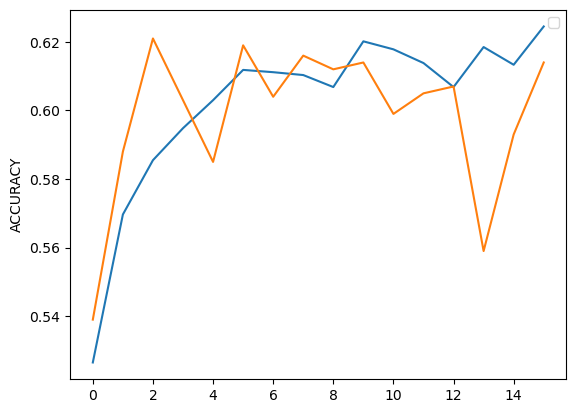

In [89]:
plt.plot(CNN_Model_Three.history["accuracy"])
plt.plot(CNN_Model_Three.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

<AxesSubplot:>

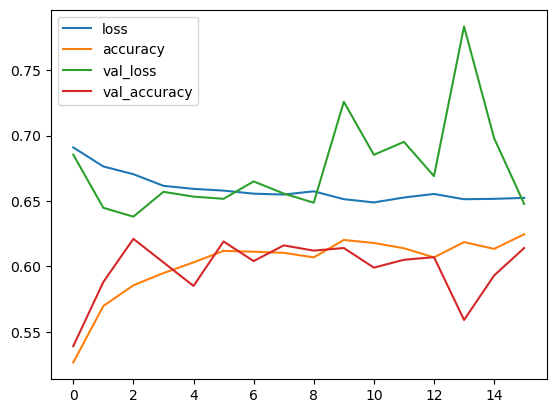

In [90]:
Dict_Summary_Three = pd.DataFrame(CNN_Model_Three.history)
Dict_Summary_Three.plot()

In [91]:
Prediction_Three = Model_Three.predict(Test_IMG_Set)
Prediction_Three = Prediction_Three.argmax(axis=-1)

In [92]:
print(Prediction_Three)

[1 1 0 ... 1 1 0]


# COMMUNITY METHODS

In [93]:
FINAL_PRED = 0.33 * (Prediction_One + Prediction_Two + Prediction_Three)

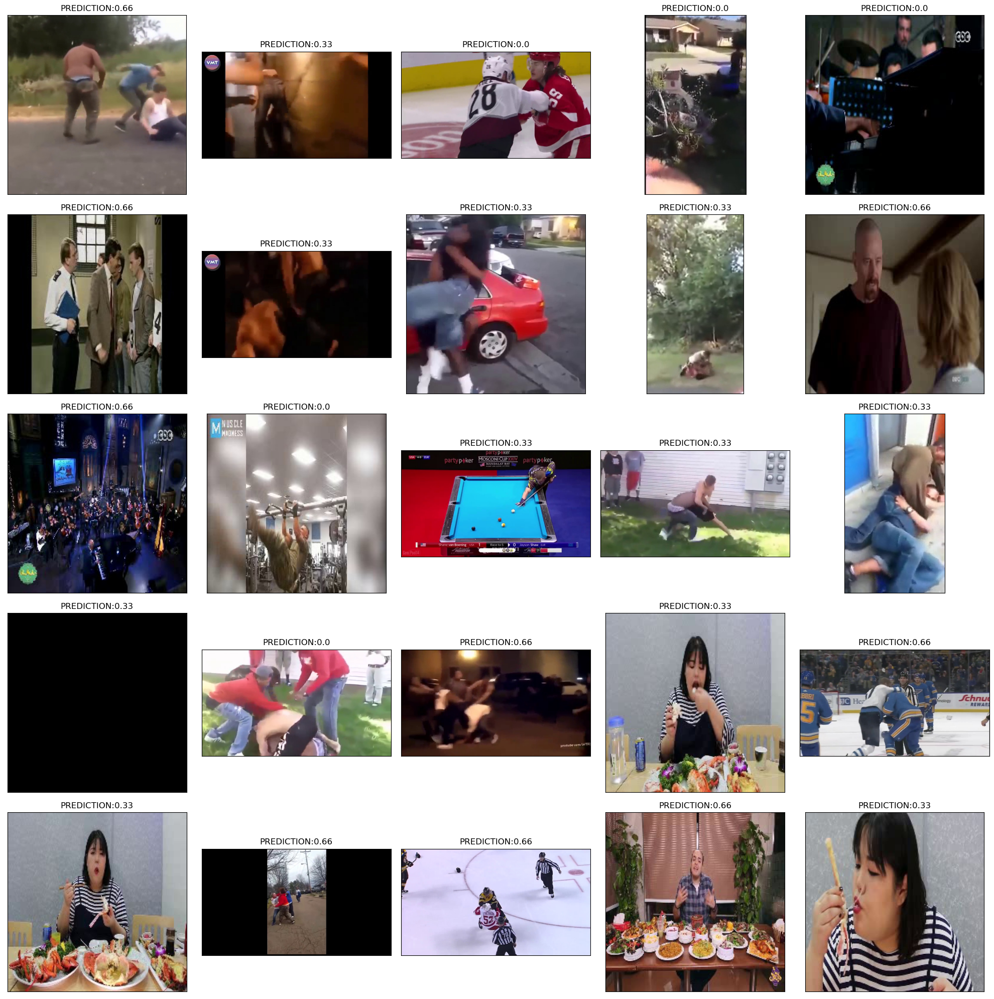

In [94]:
fig, axes = plt.subplots(nrows=5,
                         ncols=5,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Test_Data["JPG"].iloc[i]))
    ax.set_title(f"PREDICTION:{FINAL_PRED[i]}")
plt.tight_layout()
plt.show()